/var/folders/ck/5n88btq11tg1yg8ll_xpw7nr0000gn/T/ipykernel_41528/1737821464.py:227: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=(fig_width, fig_height))
/var/folders/ck/5n88btq11tg1yg8ll_xpw7nr0000gn/T/ipykernel_41528/1737821464.py:227: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=(fig_width, fig_height))
/var/folders/ck/5n88btq11tg1yg8ll_xpw7nr0000gn/T/ipykernel_41528/1737821464.py:227: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot inte

Top 5 Arbitrage Opportunities:
1. DIVING_GEAR-DOLPHIN_SIGHTINGS: 3.5078734365635214
2. BERRIES-DIVING_GEAR: 3.2561475995757014
3. BANANAS-DIVING_GEAR: 3.040338946664299
4. COCONUTS-DIVING_GEAR: 2.5407233903868303
5. PEARLS-DIVING_GEAR: 2.304728545171095


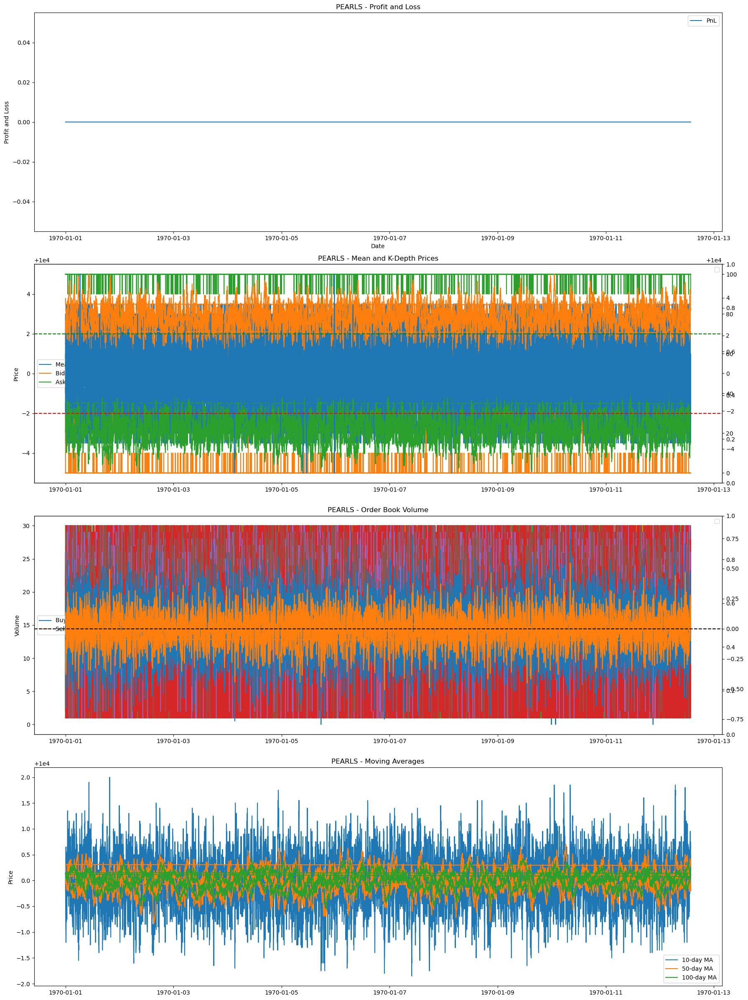

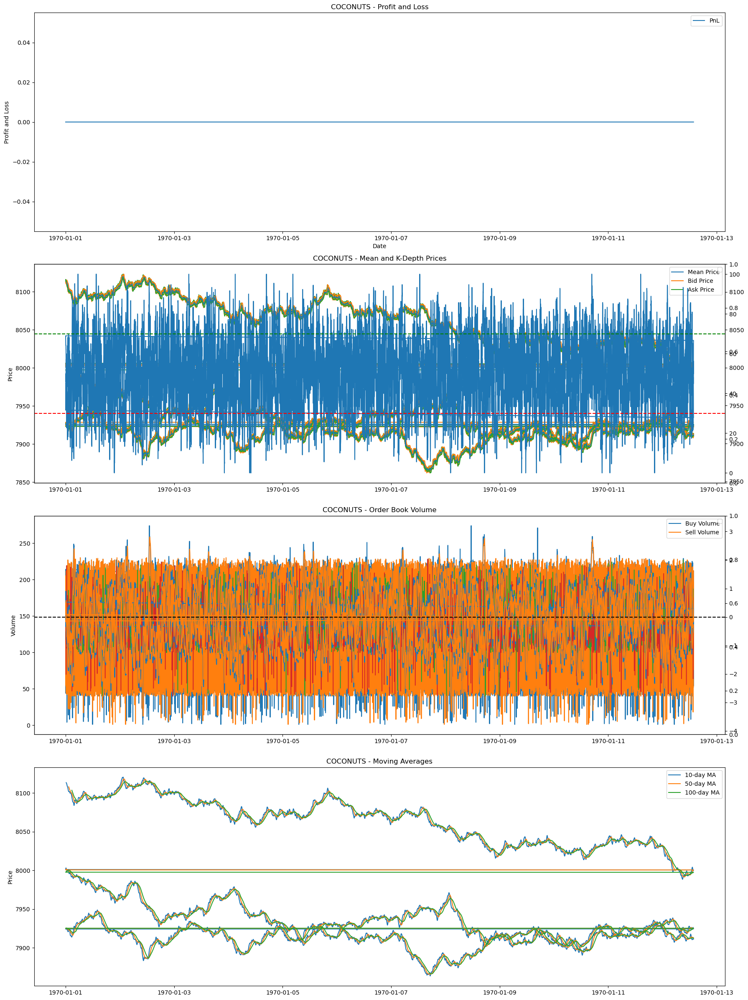

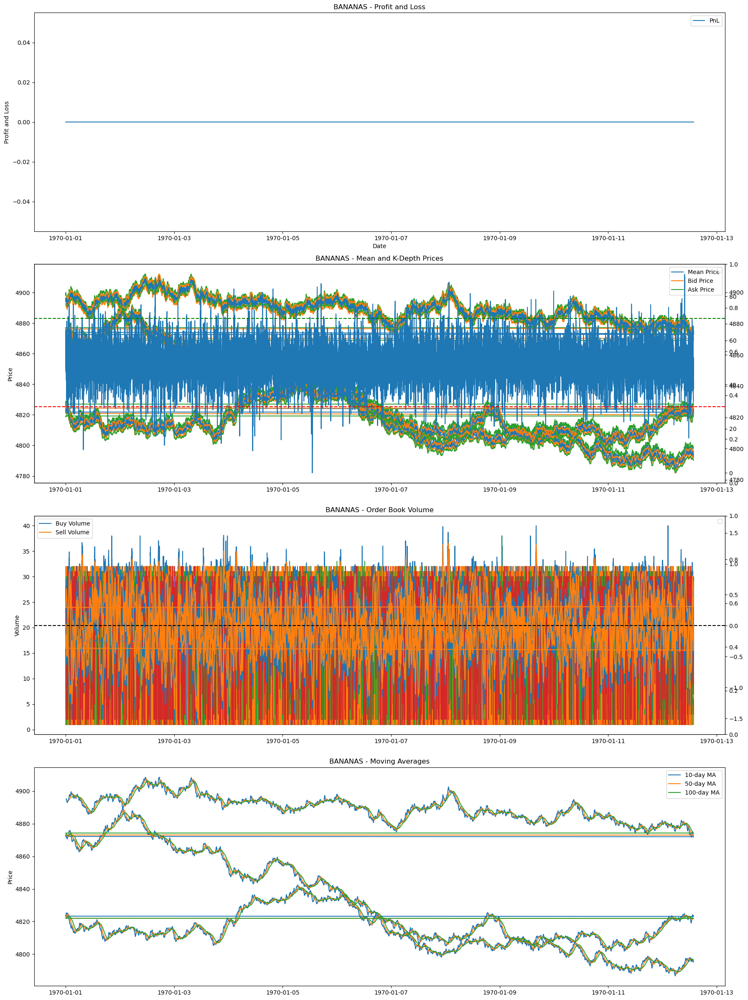

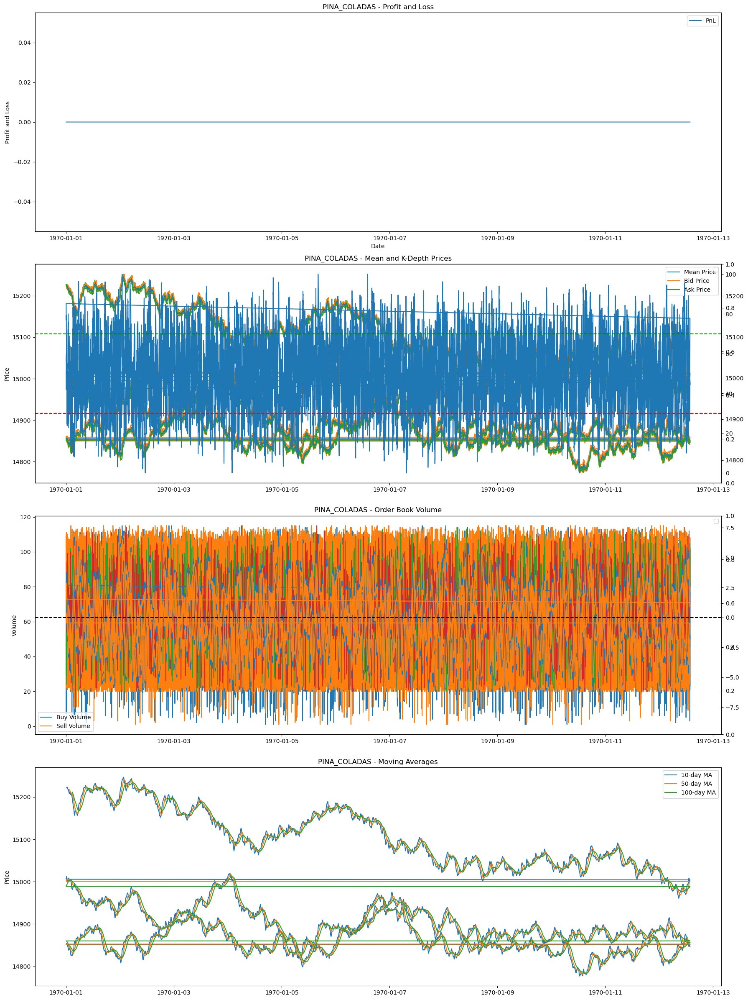

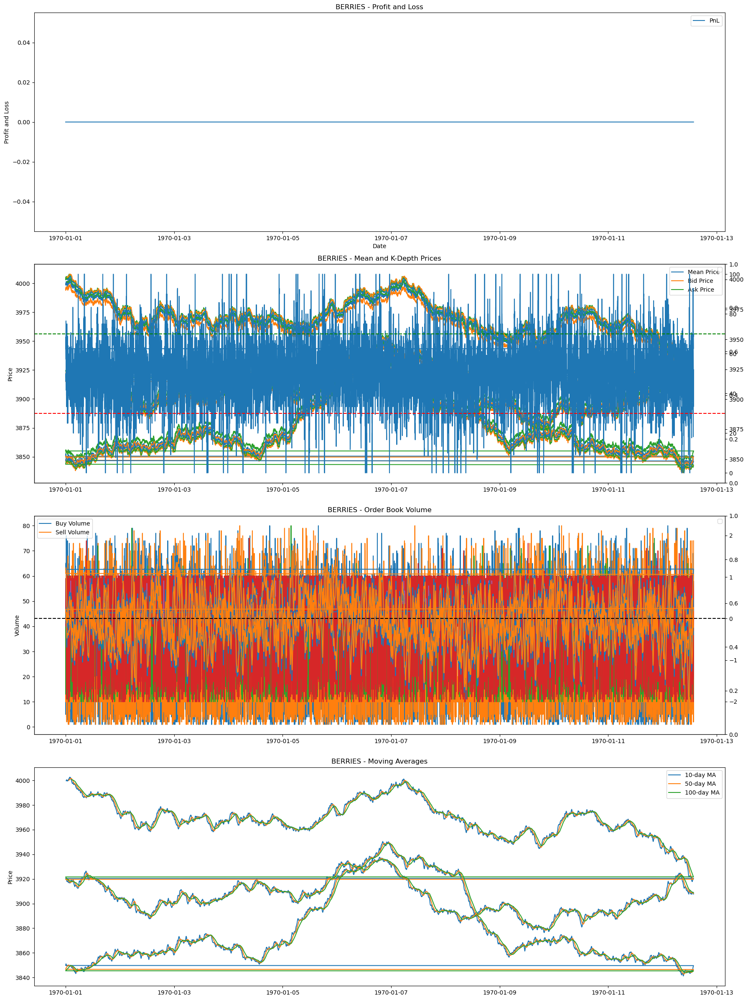

...

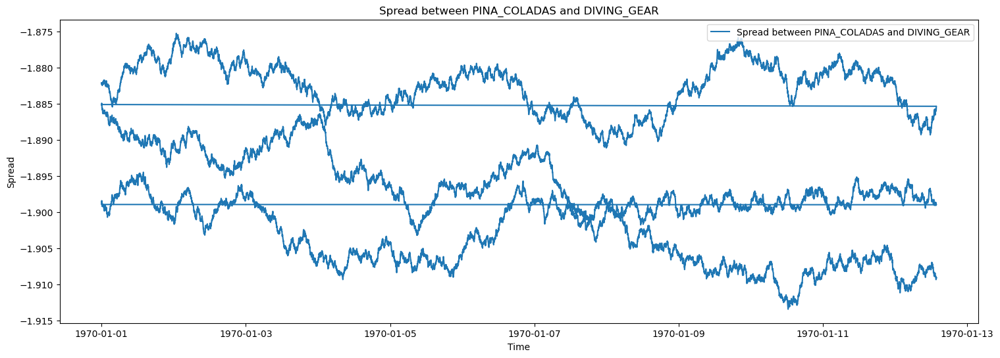

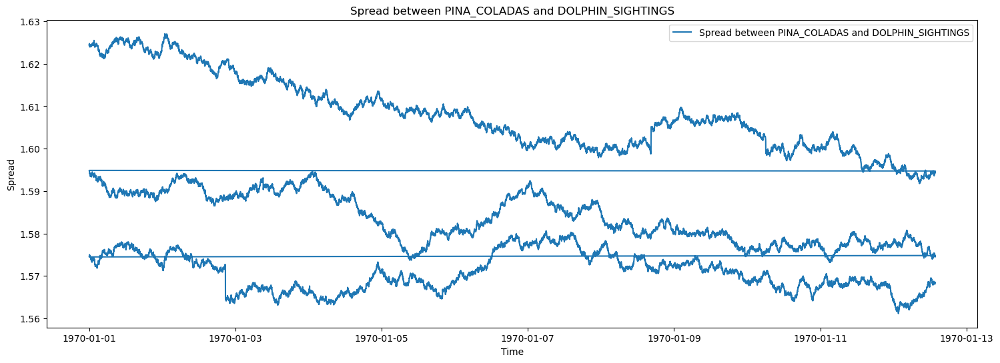

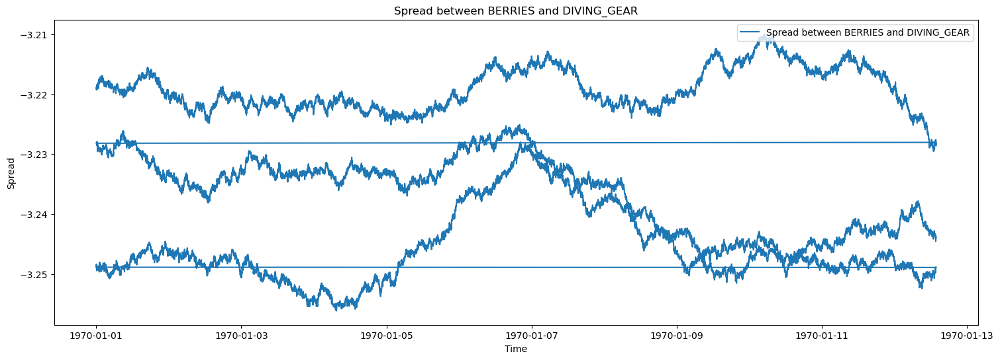

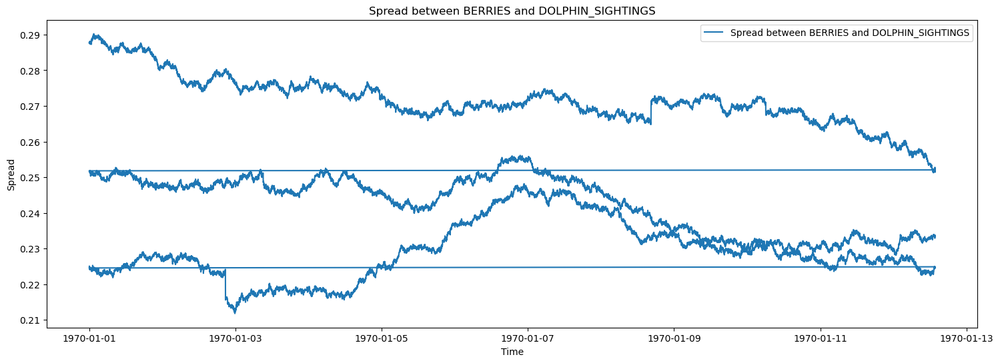

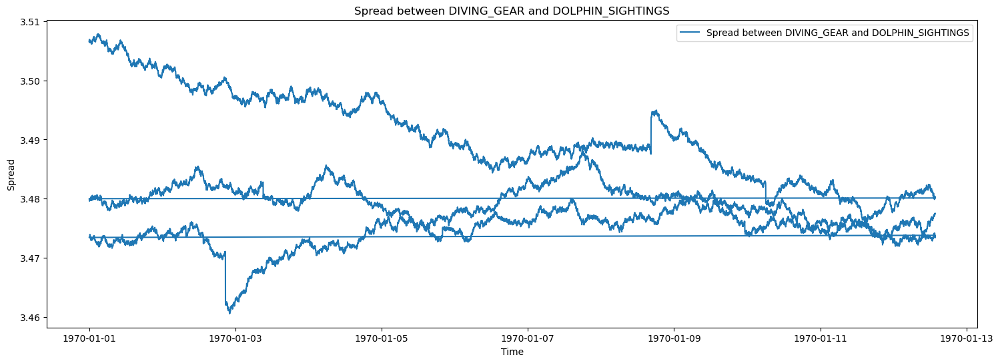

IndexError: list index out of range

In [29]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from itertools import combinations
from typing import Dict
import os
from io import BytesIO
from PIL import Image
from collections import defaultdict


IMG_ROW_HEIGHT = 50  # Set the height of the image row in Excel
IMG_SCALE = 0.75  # Set the scale factor for the images in Excel

def parse_stock_data(stock_data):
    stock_data['timestamp'] = pd.to_datetime(stock_data['timestamp'], unit='s')
    stock_data.set_index('timestamp', inplace=True)
    return stock_data

def load_order_book(file_path):
    order_book = pd.read_csv(file_path)
    return parse_stock_data(order_book)

def calculate_mid_price(order_book):
    order_book['mid_price'] = (order_book['bid_price_1'] + order_book['ask_price_1']) / 2
    return order_book


def save_figure_to_excel(writer, figs_dict, portfolio):
    for product_name, figs in figs_dict.items():
        # Save the corresponding order book data to Excel
        portfolio[product_name].to_excel(writer, sheet_name=product_name)

        # Save the figures to the Excel file
        for i, fig in enumerate(figs):
            # Convert the figure to an image
            image_data = BytesIO()
            fig.savefig(image_data, format='png', bbox_inches='tight')
            image_data.seek(0)
            title = get_subplot_title(i, product_name)  # Pass the product_name
            img = Image.open(image_data)

            # Calculate the position of the image in the sheet
            row = 1 + i * (IMG_ROW_HEIGHT + 1)
            col = 0

            # Add the image to the sheet
            sheet = writer.sheets[product_name]
            sheet.insert_image(row, col, '', {'x_scale': IMG_SCALE, 'y_scale': IMG_SCALE, 'image_data': image_data})

            # Set the row height for the image rows
            for r in range(row, row + IMG_ROW_HEIGHT):
                sheet.set_row(r, IMG_ROW_HEIGHT)



def calculate_profit_and_loss(order_book: pd.DataFrame, initial_investment: float, position: str):
    if position == "long":
        order_book["profit_and_loss"] = (order_book["mid_price"].diff()) * initial_investment
    elif position == "short":
        order_book["profit_and_loss"] = (-order_book["mid_price"].diff()) * initial_investment
    else:
        raise ValueError("Invalid position. Must be 'long' or 'short'.")

    order_book["profit_and_loss"].fillna(0, inplace=True)
    return order_book

def plot_mid_price(ax, order_book):
    ax.plot(order_book.index, order_book['mid_price'], label='Mid Price')

def plot_profit_and_loss(ax, order_book):
    ax.plot(order_book.index, order_book['profit_and_loss'], label='Profit and Loss')

def plot_moving_averages(ax, order_book, windows):
    for window in windows:
        sma = order_book['mid_price'].rolling(window=window).mean()
        ax.plot(order_book.index, sma, label=f'{window}-Day SMA')
# New function to calculate the spread
def calculate_spread(product1, product2):
    spread = np.log(product1['mid_price']) - np.log(product2['mid_price'])
    return spread

# New function to rank the top 3 arbitrage opportunities
def top_arbitrage_opportunities(spreads):
    ranked_spreads = sorted(spreads.items(), key=lambda x: x[1].abs().max(), reverse=True)
    return ranked_spreads[:5]

def plot_bollinger_bands(ax, order_book, window, num_std_dev):
    sma = order_book['mid_price'].rolling(window=window).mean()
    std_dev = order_book['mid_price'].rolling(window=window).std()

    upper_band = sma + (std_dev * num_std_dev)
    lower_band = sma - (std_dev * num_std_dev)

    ax.plot(order_book.index, sma, label=f'{window}-Day SMA')
    ax.plot(order_book.index, upper_band, label=f'Bollinger Band (+{num_std_dev} SD)')
    ax.plot(order_book.index, lower_band, label=f'Bollinger Band (-{num_std_dev} SD)')

def plot_rsi(ax, order_book, window):
    delta = order_book['mid_price'].diff()
    gain = delta.where(delta > 0, 0)
    loss = -delta.where(delta < 0, 0)

    avg_gain = gain.rolling(window=window).mean()
    avg_loss = loss.rolling(window=window).mean()

    rs = avg_gain / avg_loss
    rsi = 100 - (100 / (1 + rs))

    ax.plot(order_book.index, rsi, label='RSI')
    ax.axhline(y=30, color='r', linestyle='--', label='Oversold (30)')
    ax.axhline(y=70, color='g', linestyle='--', label='Overbought (70)')

def plot_macd(ax, order_book, short_window, long_window, signal_window):
    short_ema = order_book['mid_price'].ewm(span=short_window).mean()
    long_ema = order_book['mid_price'].ewm(span=long_window).mean()

    macd = short_ema - long_ema
    signal = macd.ewm(span=signal_window).mean()

    ax.plot(order_book.index, macd, label='MACD')
    ax.plot(order_book.index, signal, label='Signal')
    ax.axhline(y=0, color='black', linestyle='--')


def plot_mean_and_k_depth_prices(ax, order_book: pd.DataFrame, k_depth: int):
    mean_prices = order_book['mid_price']
    ax.plot(order_book.index, mean_prices, label='Mean Price')

    bid_prices = order_book[[f'bid_price_{i}' for i in range(1, k_depth+1)]].min(axis=1)
    ask_prices = order_book[[f'ask_price_{i}' for i in range(1, k_depth+1)]].max(axis=1)
    
    ax.plot(order_book.index, bid_prices, label=f'Bid Price at {k_depth}-Depth')
    ax.plot(order_book.index, ask_prices, label=f'Ask Price at {k_depth}-Depth')

def plot_order_book_volume(ax, order_book: pd.DataFrame, k_depth: int):
    for i in range(1, k_depth + 1):
        bid_volume = order_book[f'bid_volume_{i}']
        ask_volume = order_book[f'ask_volume_{i}']
        ax.plot(order_book.index, bid_volume, label=f'Bid Volume {i}')
        ax.plot(order_book.index, ask_volume, label=f'Ask Volume {i}')

def plot_total_profit_and_loss(ax, portfolio):
    for stock, order_book in portfolio.items():
        ax.plot(order_book.index, order_book['profit_and_loss'].cumsum(), label=f'{stock} Profit and Loss')
    
    total_profit_and_loss = sum(order_book['profit_and_loss'].cumsum() for order_book in portfolio.values())
    ax.plot(order_book.index, total_profit_and_loss, label='Total Profit and Loss', linewidth=2, linestyle='--')

    ax.set_title('Total Profit and Loss')
    ax.set_xlabel('Time')
    ax.set_ylabel('Profit and Loss')
    ax.legend(loc='upper right')

def plot_spread_and_moving_averages(ax, product1, product2, windows):
    spread = np.log(product1['mid_price']) - np.log(product2['mid_price'])
    ax.plot(product1.index, spread, label=f'Spread between {product1.name} and {product2.name}')

    for window in windows:
        sma = spread.rolling(window=window).mean()
        ax.plot(product1.index, sma, label=f'{window}-Period SMA for {product1.name} and {product2.name}')

    ax.axhline(y=0, color='black', linestyle='--')

def plot_individual_graphs(order_book, k_depth, product_name, title_prefix='', show_graphs=False):
    fig_width, fig_height = (18, 6) if show_graphs else (90, 30)
    fig, axes = plt.subplots(nrows=4, ncols=1, figsize=(fig_width, fig_height*4))

    plot_profit_and_loss(axes[0], order_book)
    plot_mean_and_k_depth_prices(axes[1], order_book, k_depth)
    plot_order_book_volume(axes[2], order_book, k_depth)
    plot_moving_averages(axes[3], order_book, [10, 50, 100])
    plot_bollinger_bands(axes[1].twinx(), order_book, 20, 2)
    plot_rsi(axes[1].twinx(), order_book, 14)
    plot_macd(axes[2].twinx(), order_book, 12, 26, 9)
    
    # Set titles and labels for the axes
    for i, ax in enumerate(axes):
        ax.set_title(get_subplot_title(i, product_name))
        ax.set_ylabel(get_subplot_ylabel(i))
        if i == 0:
            ax.set_xlabel('Date')
            
    # Add legends
    axes[0].legend(['PnL'])
    axes[1].legend(['Mean Price', 'Bid Price', 'Ask Price'])
    axes[2].legend(['Buy Volume', 'Sell Volume'])
    axes[3].legend(['10-day MA', '50-day MA', '100-day MA'])

    # Legends for the twinx axes
    axes[1].twinx().legend(['RSI', 'Bollinger Bands'], loc='upper right')
    axes[2].twinx().legend(['MACD', 'Signal Line'], loc='upper right')

    # Adjust the layout
    fig.tight_layout()
    
    return fig, axes


def plot_portfolio_graphs(portfolio, k_depth, title_prefix='', show_graphs=True):
    num_stocks = len(portfolio)

    def plot_spread(product1, product2, show_graphs=True):
        fig_width, fig_height = (18, 6) if show_graphs else (90, 30)
        fig, ax = plt.subplots(figsize=(fig_width, fig_height))

        spread = calculate_spread(portfolio[product1], portfolio[product2])
        ax.plot(portfolio[product1].index, spread, label=f'Spread between {product1} and {product2}')
        ax.set_title(f'Spread between {product1} and {product2}')
        ax.set_xlabel('Time')
        ax.set_ylabel('Spread')
        ax.legend(loc='upper right')
        
        if not show_graphs:
            plt.close(fig)

        return fig, spread

    # Create a dictionary to store figures grouped by product
    figs_dict = defaultdict(list)

    # Plot the individual graphs and append the figures to the corresponding product list
    for stock, order_book in portfolio.items():
        fig, axes = plot_individual_graphs(order_book, k_depth, stock, title_prefix, show_graphs)
        figs_dict[stock].append(fig)

    # Calculate and plot the spread for each pair of products
    spreads = {}
    for product1, product2 in combinations(portfolio.keys(), 2):
        fig, spread = plot_spread(product1, product2, show_graphs)
        spreads[f'{product1}-{product2}'] = spread
        # Append the spread figure to the corresponding product lists
        figs_dict[product1].append(fig)
        figs_dict[product2].append(fig)

    # Rank and display the top 3 arbitrage opportunities
    top_opportunities = top_arbitrage_opportunities(spreads)
    print("Top 5 Arbitrage Opportunities:")
    for i, (pair, spread) in enumerate(top_opportunities):
        print(f"{i + 1}. {pair}: {spread.abs().max()}")

    if show_graphs:
        plt.show()

    return figs_dict



def get_subplot_title(i, product_name):
    titles = [
        f'{product_name} - Portfolio Balance',
        f'{product_name} - Portfolio Performance',
        f'{product_name} - Cumulative Returns',
        f'{product_name} - Moving Averages'
    ]
    if i < len(titles):
        return titles[i]
    else:
        return "Title not found"  # or any other default title



def get_subplot_ylabel(index):
    ylabels = [
        'Profit and Loss',
        'Price',
        'Volume',
        'Price'  # Add the ylabel for the new graph
    ]
    return ylabels[index]


def graph_portfolio(file_paths: Dict[str, str], initial_investments: Dict[str, float], positions: Dict[str, str] = {}, k_depth=10, title_prefix='', excel_filename='graphs.xlsx', show_graphs=True):
    portfolio = {}
    for product, file_path in file_paths.items():
        order_book = load_order_book(file_path)
        initial_investment = initial_investments.get(product, 0)
        position = positions.get(product, 'long')
        pnl_order_book = calculate_profit_and_loss(order_book, initial_investment, position)
        portfolio[product] = pnl_order_book

    figs_dict = plot_portfolio_graphs(portfolio, k_depth, title_prefix)

    # Save figure to Excel
    if os.path.exists(excel_filename):
        os.remove(excel_filename)
    with pd.ExcelWriter(excel_filename, engine='xlsxwriter') as writer:
        save_figure_to_excel(writer, figs_dict, portfolio)

# Example usage
file_paths = {
    'PEARLS': 'Prosperity3/PEARLS.csv',
    'COCONUTS': 'Prosperity3/COCONUTS.csv',
    'BANANAS': 'Prosperity3/BANANAS.csv',
    'PINA_COLADAS': 'Prosperity3/PINA_COLADAS.csv',
    'BERRIES': 'Prosperity3/BERRIES.csv',
    'DIVING_GEAR': 'Prosperity3/DIVING_GEAR.csv',
    'DOLPHIN_SIGHTINGS': 'Prosperity3/DOLPHIN_SIGHTINGS.csv',
}

initial_investments = {
    'PEARLS': 0,
    'COCONUTS': 0,
    'BANANAS': 0,
    'PINA_COLADAS': 0,
    'BERRIES': 0,
    'DIVING_GEAR': 0,
}

positions = {
    'PEARLS': 'long',
    'COCONUTS': 'short',
    'BANANAS': 'long',
    'PINA_COLADAS': 'short',
    'BERRIES': 'short',
    'DIVING_GEAR': 'long',
}

k_depth = 3
title_prefix = 'Sample'

excel_filename = 'graphs.xlsx'

show_graphs = False  # Set this value to False to hide the graphs

graph_portfolio(file_paths, initial_investments, positions, k_depth, title_prefix, excel_filename, show_graphs)

